# Обработка и распознавание изображений. Лаб. раб. #1

ВМК МГУ им. М.В.Ломоносова, кафедра ММП

Выполнил: Алексеев Илья Алексеевич, 317 группа



In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision.transforms as T
from PIL import Image
import cv2

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')

import re
from time import time
from glob import glob
from functools import partial
from scipy.stats import entropy
from collections import defaultdict

random_seed = 1
torch.backends.cudnn.enabled = False
torch.manual_seed(random_seed)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


## Preparations

### Tantrix Dataset

In [2]:
# ! rm -r data
# ! rm data.zip
! unzip data

Archive:  data.zip
   creating: data/
   creating: data/shuffled/
  inflating: data/shuffled/11-76.bmp  
  inflating: data/shuffled/11-2.bmp  
  inflating: data/shuffled/11-74.bmp  
  inflating: data/shuffled/11-73.bmp  
  inflating: data/shuffled/11-75.bmp  
  inflating: data/shuffled/11-1.bmp  
  inflating: data/shuffled/11-3.bmp  
  inflating: data/shuffled/11-5.bmp  
  inflating: data/shuffled/11-7.bmp  
  inflating: data/shuffled/11-9.bmp  
  inflating: data/shuffled/11-11.bmp  
  inflating: data/shuffled/11-13.bmp  
  inflating: data/shuffled/11-15.bmp  
  inflating: data/shuffled/11-17.bmp  
  inflating: data/shuffled/11-19.bmp  
  inflating: data/shuffled/11-33.bmp  
  inflating: data/shuffled/11-34.bmp  
  inflating: data/shuffled/11-35.bmp  
  inflating: data/shuffled/11-66.bmp  
  inflating: data/shuffled/11-70.bmp  
  inflating: data/shuffled/11-72.bmp  
  inflating: data/shuffled/11-46.bmp  
  inflating: data/shuffled/11-47.bmp  
  inflating: data/shuffled/11-48.bmp  
  in

In [3]:
class TantrixDataset(torch.utils.data.Dataset):
    def __init__(self, dir_path, transforms=None):
        self.dir_path = dir_path
        self.transforms = transforms
        self.images_file_names = sorted(glob(dir_path + '/*.bmp'))
        
    def __len__(self):
        return len(self.images_file_names)
                   
    def __getitem__(self, idx):
        """
        Arguments
        ---------
        idx : int
            Index of image and mask
        
        Returns
        -------
        (image, label)
        """
        # load image
        image = Image.open(self.images_file_names[idx])
        # retrieve label from filename
        label = re.split(pattern='\.|/|-', string=self.images_file_names[idx])[-3]
        
        # apply transforms
        if self.transforms:
            image = self.transforms(image)
        else:
            image = T.functional.to_tensor(image)
        
        return image, int(label)-1 

In [4]:
class GaussianNoise(object):
    def __init__(self, p=0.5, mean=0., std=1.):
        self.p = p
        self.std = std
        self.mean = mean
        
    def __call__(self, tensor):
        if torch.rand(1) < self.p:
            return tensor + torch.randn(tensor.size()) * self.std + self.mean
        return tensor
    
    def __repr__(self):
        return self.__class__.__name__ + f'(mean={self.mean:.4f}, std={self.std:.4f})'

In [5]:
mean = [0.5174, 0.4094, 0.3422]
std = [0.3287, 0.3612, 0.3862]

transforms = T.Compose([
    T.Resize(size=(16,16)),
    T.RandomAffine(
      degrees=180,
      shear=15,  
      fill=255
    ),
    T.ToTensor(),
    # T.RandomChoice([
    GaussianNoise(
      p=0.5,
      mean=0,
      std=0.05
    ),
    T.RandomErasing(
      scale=(0.02, 0.05),
      value='random'
    ),
    T.ColorJitter(
      brightness=0.5,
      contrast=0.35,
      saturation=0.25,
      hue=0.05
    ),
    # ]),
    T.GaussianBlur(
      kernel_size=3,
      sigma=0.5
    ),
    T.Normalize(mean=mean, std=std),
])

test_trans = T.Compose([
    T.Resize(size=(16,16)),
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])

train_data = TantrixDataset(dir_path='data/train', transforms=transforms)
print('pics in train:', len(train_data))
test_data = TantrixDataset(dir_path='data/test', transforms=test_trans)
print('pics in test:', len(test_data))

train_loader = torch.utils.data.DataLoader(
  dataset=train_data, batch_size=19, shuffle=True)
test_loader = torch.utils.data.DataLoader(
  dataset=test_data, batch_size=len(test_data), shuffle=False)

pics in train: 76
pics in test: 37


### Training and Evaluation Utilites

In [6]:
def param_count(model):
  return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [7]:
def train(network, train_loader, criterion, optimizer, epoch, writer):
  network.train()

  for i, batch in enumerate(train_loader):
    data, target = batch[0].to(device), batch[1].to(device)

    optimizer.zero_grad()
    output = network(data)
    loss = criterion(output, target)
    loss.backward()
    optimizer.step()

    writer.add_scalar('Loss/train', loss.item(), (i+1)*7+epoch*len(train_loader.dataset))

In [8]:
def test(network, test_loader, criterion, epoch, writer):
  test_loss = 0
  correct = 0

  network.eval()
  with torch.no_grad():
    for data, target in test_loader:
      # send data to device
      data, target = data.to(device), target.to(device)
      
      for i, (img, label) in enumerate(zip(data, target)):
        # make batch
        img = img.unsqueeze(0)
        label = label.unsqueeze(0)
        
        # define hook function
        def hook(name, module, inp, out):
          out = out.squeeze(0)
          for j in range(out.shape[0]):
            # out[j] -= out[j].min()
            # out[j] /= out[j].max()
            writer.add_image(f'img-{i}/map-{j}-module-{name}', out[j], epoch, dataformats='HW')

        # register hooks
        handlers = []
        for name, layer in model.named_modules():
          if not isinstance(layer, VGGBlock):
            continue
          layer.__name__ = name
          handler = layer.register_forward_hook(partial(hook, name))
          handlers.append(handler)

        # forward pass
        output = network(img)
        test_loss += criterion(output, label, reduction='sum').item()

        # disable hooks
        for handler in handlers:
          handler.remove()
        
        # prediction
        pred = output.data.max(1, keepdim=True)[1]
        correct += pred.eq(label.data.view_as(pred)).sum()

        # probabilities
        prob = F.softmax(output.detach().cpu(), dim=1)
        fig, ax = plt.subplots()
        ax.bar(x=range(prob.shape[1]), height=prob.squeeze(0))
        ax.set_xlabel('class')
        ax.set_ylabel('probability')
        ax.set_xticks(range(len(prob)))
        writer.add_figure(f'Probs/{i}', fig, epoch)

  test_loss /= len(test_loader.dataset)
  test_accur = correct / len(test_loader.dataset)
  
  writer.add_scalar('Loss/test', test_loss, epoch)
  writer.add_scalar('Accuracy/test', test_accur, epoch)

In [9]:
def train_test(
    network, n_epochs, criterion, optimizer,
    train_loader, test_loader, log_interval, scheduler=None,
    filename='', savemodel=True, writer=None
  ):
  # train history
  train_accurs = []
  train_losses = []
  train_counter = []
  test_accurs = []
  test_losses = []
  timers = []

  # train
  test(network, test_loader, criterion, 0, writer)
  start = time()
  for epoch in range(1, n_epochs + 1):
    train(network, train_loader, criterion, optimizer, epoch, writer)
    if epoch % log_interval == 0:
      test(network, test_loader, criterion, epoch, writer)
    
    if scheduler is not None:
      scheduler.step()
    
    if savemodel:
      torch.save(network.state_dict(), f'models/mod_{filename}.pth')
      torch.save(optimizer.state_dict(), f'models/opt_{filename}.pth')

In [11]:
from scipy.stats import entropy


def simple_test(network, batch):
  test_loss = 0
  correct = 0
  entropies = []

  network.eval()
  data, target = batch
  with torch.no_grad():
    # send data to device
    data, target = data.to(device), target.to(device)
    
    # forward pass
    output = network(data)
    
    # prediction
    pred = output.data.max(1, keepdim=True)[1]
    correct += pred.eq(target.data.view_as(pred)).sum()

    # probabilities
    probs = F.softmax(output.detach(), dim=1).cpu()
    data = data.cpu()
    target = target.cpu()

    n = probs.shape[0]
    fig, ax = plt.subplots(2, n, figsize=(2*n, 3))
    for i, prob in enumerate(probs):
      ax[0, i].bar(x=range(probs.shape[1]), height=prob)
      ent = entropy(prob)
      entropies.append(ent)
      ax[0, i].set_title(f'ent: {ent:.3f}')
      img = data[i].permute(1, 2, 0)
      img = torch.clip(img * torch.tensor(std) + torch.tensor(mean), min=0, max=1)
      ax[1, i].imshow(img)
      ax[1, i].set_title(f'true/pred: {target[i].item()}/{prob.argmax()}')
      
      ax[0, i].set_axis_off()
      ax[1, i].set_axis_off()

  test_accur = correct / len(data)

  return test_accur.item(), entropies

### Model

In [12]:
class VGGBlock(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()
    self.layers = torch.nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2),
        nn.BatchNorm2d(out_channels)
    )
  
  def forward(self, x):
    return self.layers(x)

In [13]:
from collections import OrderedDict

class VGG(nn.Module):
  def __init__(self):
    super().__init__()

    self.layers = nn.Sequential(OrderedDict([
        ('vgg1', VGGBlock(3, 30)),
        ('vgg2', VGGBlock(30, 60)),
        ('flatten', nn.Flatten()),
        ('clf', nn.Linear(960, 11))
    ]))
  
  def forward(self, x):
    return self.layers(x)

In [14]:
param_count(VGG())

68621

## Lets Go!

In [20]:
! rm -r runs

In [15]:
from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [16]:
writer = SummaryWriter()

model = VGG().to(device)

train_test(
    network=model,
    n_epochs=2000,
    criterion=nn.functional.cross_entropy,
    optimizer=torch.optim.Adam(params=model.parameters()),
    train_loader=train_loader,
    test_loader=test_loader,
    savemodel=False,
    writer=writer,
    log_interval=200
)

writer.close()

In [17]:
torch.save(model.state_dict(), 'my.pth')

accuracy: 0.9729729890823364


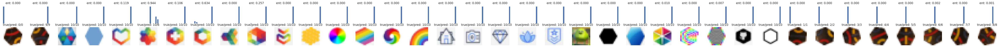

In [18]:
acc, _ = simple_test(model, next(iter(test_loader)))
print('accuracy:', acc)

## Tests

### Non chips

In [27]:
random_data = TantrixDataset(dir_path='data/random', transforms=test_trans)

random_loader = torch.utils.data.DataLoader(
  dataset=random_data, batch_size=len(random_data), shuffle=False)

In [28]:
def imshow(img, label, mean=0, std=1, figsize=(1.5, 1.5)):
    img = img.permute(1, 2, 0)
    img = img * std + mean
    img = torch.clip(img, min=0, max=1)
    
    plt.figure(figsize=figsize)

    plt.imshow(img.numpy())
    plt.title(f'true label: {label}')
    plt.axis('off')
    
    plt.show()

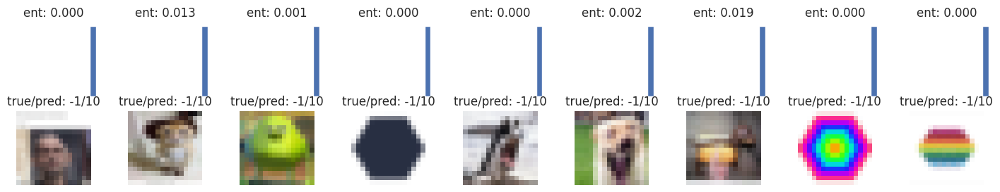

In [29]:
_ = simple_test(model, next(iter(random_loader)))

### Augmented Test

In [30]:
tmp_data = TantrixDataset(dir_path='data/test', transforms=transforms)
tmp_loader = torch.utils.data.DataLoader(
  dataset=tmp_data, batch_size=len(tmp_data), shuffle=False)

accuracy: 0.9729729890823364


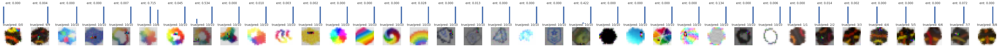

In [31]:
acc, _ = simple_test(model, next(iter(tmp_loader)))
print('accuracy:', acc)

## Working Pipeline

### Get Hexagons and Their Centers

In [19]:
! unzip images

Archive:  images.zip
   creating: images/
  inflating: images/Single_4.bmp     
  inflating: images/Single_5.bmp     
  inflating: images/Path_9.bmp       
  inflating: images/Single_7.bmp     
  inflating: images/Single_6.bmp     
  inflating: images/Path_10.bmp      
  inflating: images/Path_8.bmp       
  inflating: images/Single_2.bmp     
  inflating: images/Single_3.bmp     
  inflating: images/Single_1.bmp     
  inflating: images/Single_0.bmp     
  inflating: images/Dozen_0.bmp      
  inflating: images/Group_6.bmp      
  inflating: images/Group_4.bmp      
  inflating: images/Group_5.bmp      
  inflating: images/Path_5.bmp       
  inflating: images/Group_1.bmp      
  inflating: images/Path_4.bmp       
  inflating: images/Path_6.bmp       
  inflating: images/Single_8.bmp     
  inflating: images/Group_2.bmp      
  inflating: images/Group_3.bmp      
  inflating: images/Single_9.bmp     
  inflating: images/Path_7.bmp       


In [20]:
files = glob('images/*.bmp')
images = {}
for file in files:
    img = cv2.imread(file, cv2.IMREAD_COLOR)
    # images[name] is numpy array of shape (H,W,C)
    images[file[7:-4]] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
images.keys()

dict_keys(['Group_6', 'Single_7', 'Single_8', 'Group_1', 'Dozen_0', 'Path_10', 'Path_8', 'Group_3', 'Group_2', 'Path_6', 'Single_5', 'Single_2', 'Group_5', 'Path_9', 'Group_4', 'Single_6', 'Path_5', 'Single_0', 'Single_3', 'Single_4', 'Single_9', 'Single_1', 'Path_4', 'Path_7'])

In [21]:
def get_hexagons(images, output_shape=(16, 16)):
    """
    Returns:
    --------
    detected: dict of lists
        detected[img_filename] = [hex1, hex2, ...]
        hex{i} is numpy array of shape (16,16,3), cropped and masked chip
    centers: dist of lists
        centers[img_filename] = [c1, c2, ...]
        c{i} is tuple (x,y), center of hex{i}
    """
    # binarize with otsu method (because findContours needs binized image)
    binarized = {}
    thresh = {}
    for key, img in images.items():
        # to grayscale
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # binarize
        th, img_bin = cv2.threshold(img_gray, 128, 255, cv2.THRESH_OTSU)

        binarized[key] = img_bin
        thresh[key] = th

    # find all hexagons on image
    hexagons = defaultdict(list)
    centers = defaultdict(list)
    for key in binarized.keys():
        # main procedure
        contours, _ = cv2.findContours(
            255-binarized[key], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            # compute perimeter of contour
            peri = cv2.arcLength(cnt, True)
            # perform contour approximation
            approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)

            # filter non hexagons
            if len(approx) != 6:
                continue

            # find center of hexagon
            M = cv2.moments(cnt)
            x = int((M["m10"] + 1e-3) / (M["m00"] + 1e-3))
            y = int((M["m01"] + 1e-3) / (M["m00"] + 1e-3))

            centers[key].append((x, y))
            hexagons[key].append(cnt)

    # mask, crop and resize each hexagon
    detected = defaultdict(list)
    for key in images.keys():
        for i, cnt in enumerate(hexagons[key]):
            # coords for cropping
            x, y, w, h = cv2.boundingRect(cnt)

            # mask of hexagon
            # because images has shape (H,W,C) but we need (H,W)
            shape = images[key].shape[0], images[key].shape[1]
            mask_ = cv2.drawContours(
                np.zeros(shape), hexagons[key], i, color=1, thickness=-1).astype(int)

            # we need to broadcast `mask` manually
            mask = np.array([mask_, mask_, mask_])
            mask = np.moveaxis(mask, 0, -1)

            # remove everything except the hexagon
            masked = images[key] * mask

            # add white background
            masked[mask == 0] = 255

            # crop
            cropped = masked[y:y+h, x:x+w].astype(float)

            # resize
            resized = cv2.resize(cropped, output_shape).astype(int)

            detected[key].append(resized)

    return detected, centers

In [22]:
detected, centers = get_hexagons(images)
detected.keys()

dict_keys(['Group_6', 'Single_7', 'Single_8', 'Group_1', 'Dozen_0', 'Group_3', 'Group_2', 'Path_6', 'Single_5', 'Single_2', 'Group_5', 'Path_9', 'Group_4', 'Single_6', 'Path_5', 'Single_0', 'Single_3', 'Single_4', 'Single_9', 'Single_1', 'Path_7'])

### Feed to Net

In [26]:
model = VGG().to(device)
model.load_state_dict(torch.load('my.pth'))

<All keys matched successfully>

In [41]:
def put_labels(detected, centers, ent_thresh=0.4):
  """
  Returns:
  --------
  tagged: dict of images
      tagged[img_filename] is image with labels put onto it
  """
  with torch.no_grad():
      tagged = defaultdict(list)
      for key, hexagons in detected.items():
          # image to put labels to
          tagged[key] = images[key].copy()
          
          # make one batch of images
          shape = hexagons[0].shape
          batch = torch.empty((len(hexagons), shape[2], shape[0], shape[1]))
          for i, hex in enumerate(hexagons):
              blurred = cv2.GaussianBlur(hex.astype(float), (3,3), 0.65)
              tensored = T.functional.to_tensor(blurred).permute(1,2,0)
              img = (tensored - torch.tensor(mean)) / torch.tensor(std)
              batch[i] = img.float().permute(2,0,1)
          
          # forward pass
          logits = model(batch.to(device))
          
          # get probabilities
          probs = F.softmax(logits.detach(), dim=1).cpu()
          
          # filter non chips
          for prob, center in zip(probs, centers[key]):
              pred = prob.argmax().item()+1
              ent = entropy(prob)
              if ent > ent_thresh or pred == 11:
                  continue
              cv2.putText(tagged[key], str(pred), center, cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 4)
  return tagged

In [42]:
tagged = put_labels(detected, centers)
tagged.keys()

dict_keys(['Group_6', 'Single_7', 'Single_8', 'Group_1', 'Dozen_0', 'Group_3', 'Group_2', 'Path_6', 'Single_5', 'Single_2', 'Group_5', 'Path_9', 'Group_4', 'Single_6', 'Path_5', 'Single_0', 'Single_3', 'Single_4', 'Single_9', 'Single_1', 'Path_7'])

### Demonstation

In [43]:
def imshow(prefix, src, use_colors=False, figname=None):
    """
    show images of whole group:
        prefix = 'Single' / 'Dozen' / 'Group'
    """
    keys = [key for key in src.keys() if key.startswith(prefix)]
    n = len(keys)
    _, ax = plt.subplots(1 + (prefix == 'Dozen'), n, figsize=(n*6, 12))
    for i, key in enumerate(keys):
        if use_colors:
            ax[i].imshow(src[key])
        else:
            ax[i].imshow(src[key], cmap='gray')
        ax[i].axis('off')
        ax[i].set_title(key)
    if figname is not None:
        plt.savefig(figname + '.svg')

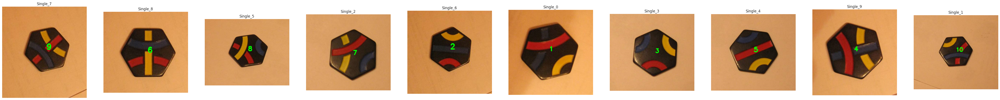

In [39]:
imshow('Single', tagged)

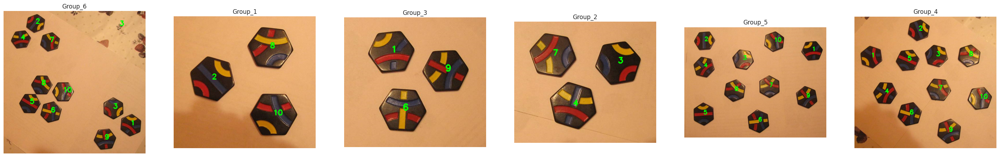

In [44]:
imshow('Group', tagged)

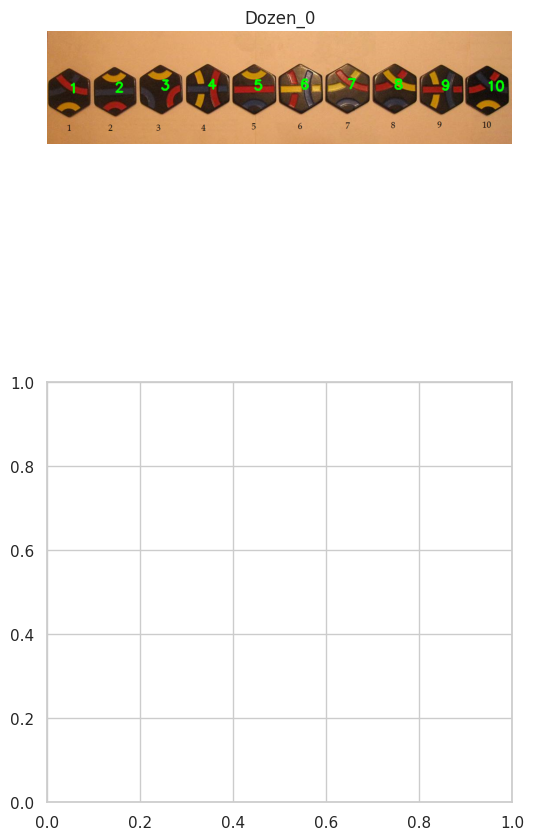

In [45]:
imshow('Dozen', tagged)

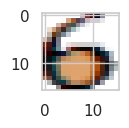

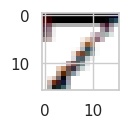

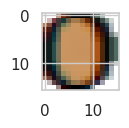

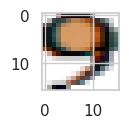

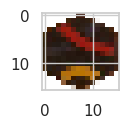

...

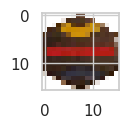

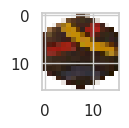

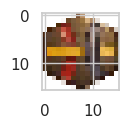

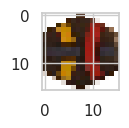

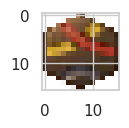

In [33]:
for det in detected['Dozen_0']:
  plt.figure(figsize=(1,1))
  plt.imshow(det)
  plt.show()